In [4]:
library(latex2exp)
library(nonlinearTseries)
library(plot3D)
library(raster)
library(dplyr)
library(lubridate)

Registered S3 method overwritten by 'quantmod':
  method            from
  as.zoo.data.frame zoo 


載入套件：'nonlinearTseries'


下列物件被遮斷自 'package:grDevices':

    contourLines


載入需要的套件：sp


載入套件：'dplyr'


下列物件被遮斷自 'package:raster':

    intersect, select, union


下列物件被遮斷自 'package:stats':

    filter, lag


下列物件被遮斷自 'package:base':

    intersect, setdiff, setequal, union



載入套件：'lubridate'


下列物件被遮斷自 'package:raster':

    intersect, union


下列物件被遮斷自 'package:base':

    date, intersect, setdiff, union




In [5]:
mydata=read.csv("5 min normal ECG ver1 20220509.csv",stringsAsFactors=FALSE)
mydata=as.data.frame(mydata)
mydata_std <- mydata %>% mutate_at(c('ECG'), ~(scale(.) %>% as.vector))
head(mydata_std)
dim(mydata_std)

,ECG,X125,Hz
,<dbl>,<lgl>,<lgl>
1,-0.35689475,NA,NA
2,-0.20678348,NA,NA
3,0.02888795,NA,NA
4,0.26654015,NA,NA
5,0.46126882,NA,NA
6,0.65991828,NA,NA


[1] 31575     3

In [15]:
## create index for split time series data
indices=array(0,dim=c(7500,33))
for(i in 1:33){
  indices[,i]=c((1+750*(i-1)):(1+750*(i-1)+7500-1))
}
head(indices)
tail(indices)

1,751,1501,2251,3001,3751,4501,5251,6001,6751,...,17251,18001,18751,19501,20251,21001,21751,22501,23251,24001
2,752,1502,2252,3002,3752,4502,5252,6002,6752,...,17252,18002,18752,19502,20252,21002,21752,22502,23252,24002
3,753,1503,2253,3003,3753,4503,5253,6003,6753,...,17253,18003,18753,19503,20253,21003,21753,22503,23253,24003
4,754,1504,2254,3004,3754,4504,5254,6004,6754,...,17254,18004,18754,19504,20254,21004,21754,22504,23254,24004
5,755,1505,2255,3005,3755,4505,5255,6005,6755,...,17255,18005,18755,19505,20255,21005,21755,22505,23255,24005
6,756,1506,2256,3006,3756,4506,5256,6006,6756,...,17256,18006,18756,19506,20256,21006,21756,22506,23256,24006


"[7495,]",7495,8245,8995,9745,10495,11245,11995,12745,13495,14245,...,24745,25495,26245,26995,27745,28495,29245,29995,30745,31495
"[7496,]",7496,8246,8996,9746,10496,11246,11996,12746,13496,14246,...,24746,25496,26246,26996,27746,28496,29246,29996,30746,31496
"[7497,]",7497,8247,8997,9747,10497,11247,11997,12747,13497,14247,...,24747,25497,26247,26997,27747,28497,29247,29997,30747,31497
"[7498,]",7498,8248,8998,9748,10498,11248,11998,12748,13498,14248,...,24748,25498,26248,26998,27748,28498,29248,29998,30748,31498
"[7499,]",7499,8249,8999,9749,10499,11249,11999,12749,13499,14249,...,24749,25499,26249,26999,27749,28499,29249,29999,30749,31499
"[7500,]",7500,8250,9000,9750,10500,11250,12000,12750,13500,14250,...,24750,25500,26250,27000,27750,28500,29250,30000,30750,31500


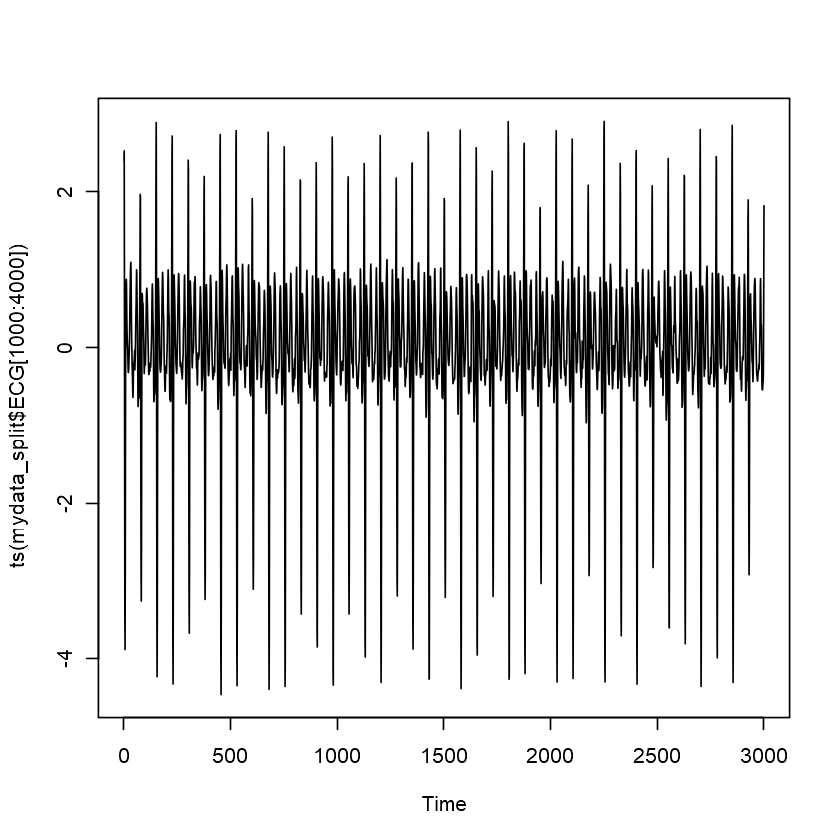

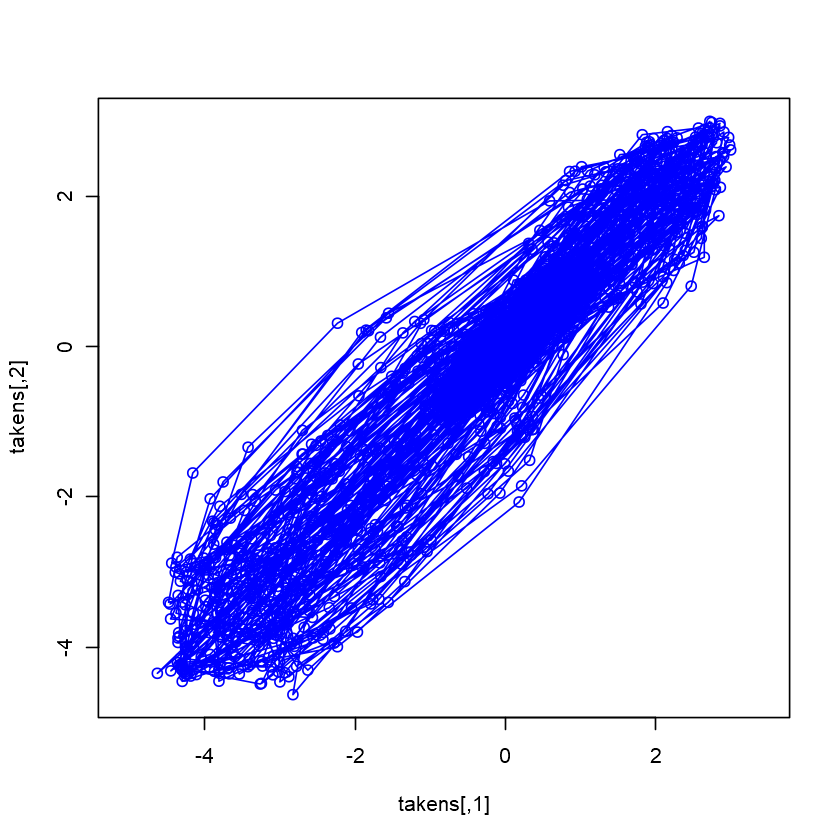

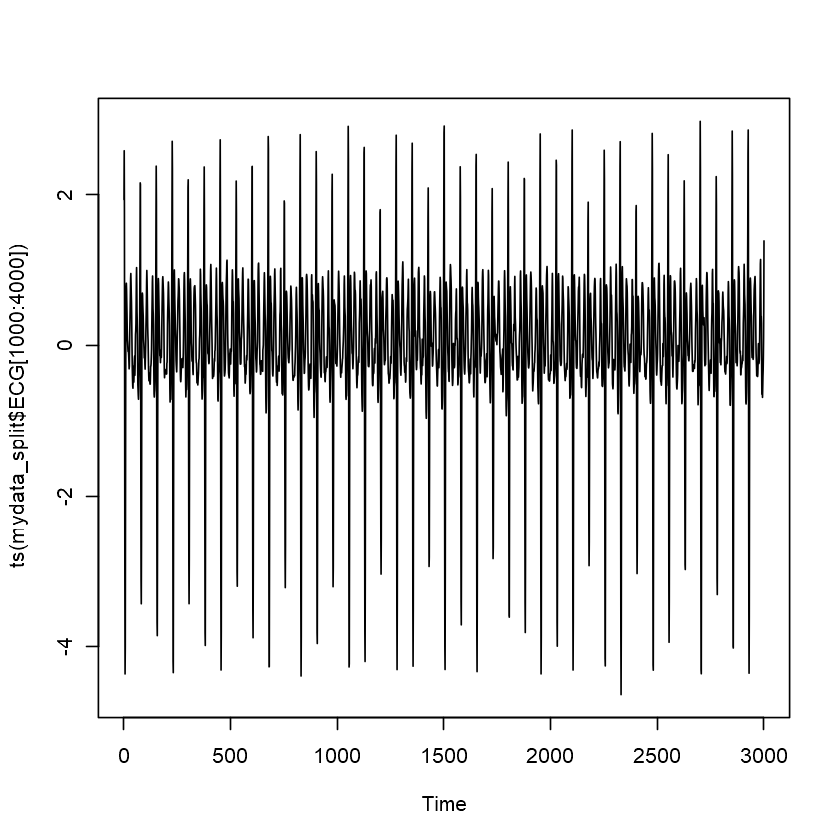

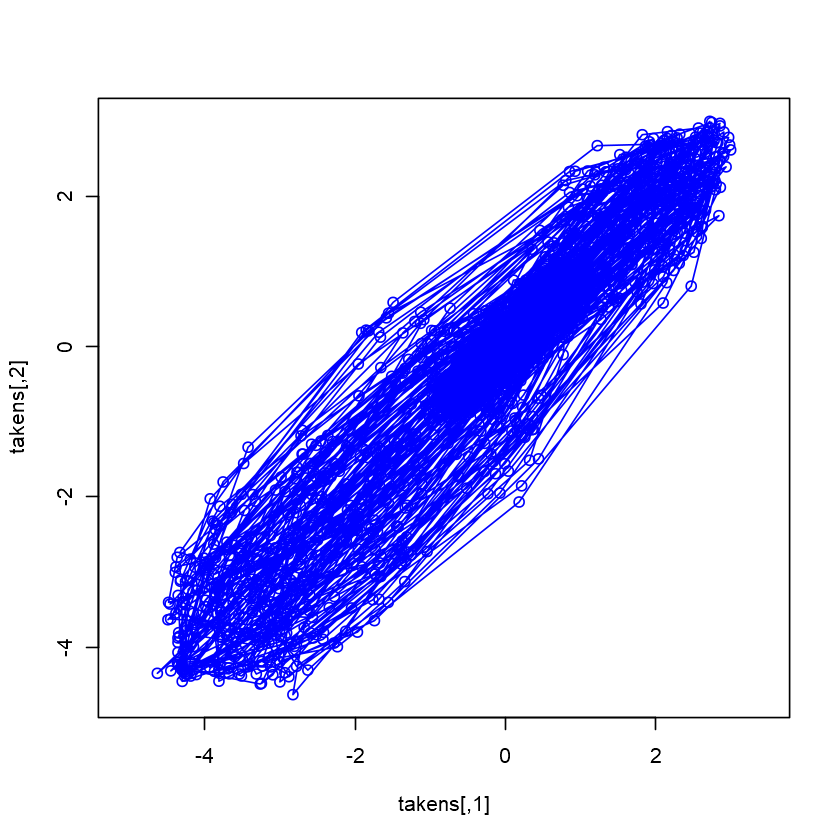

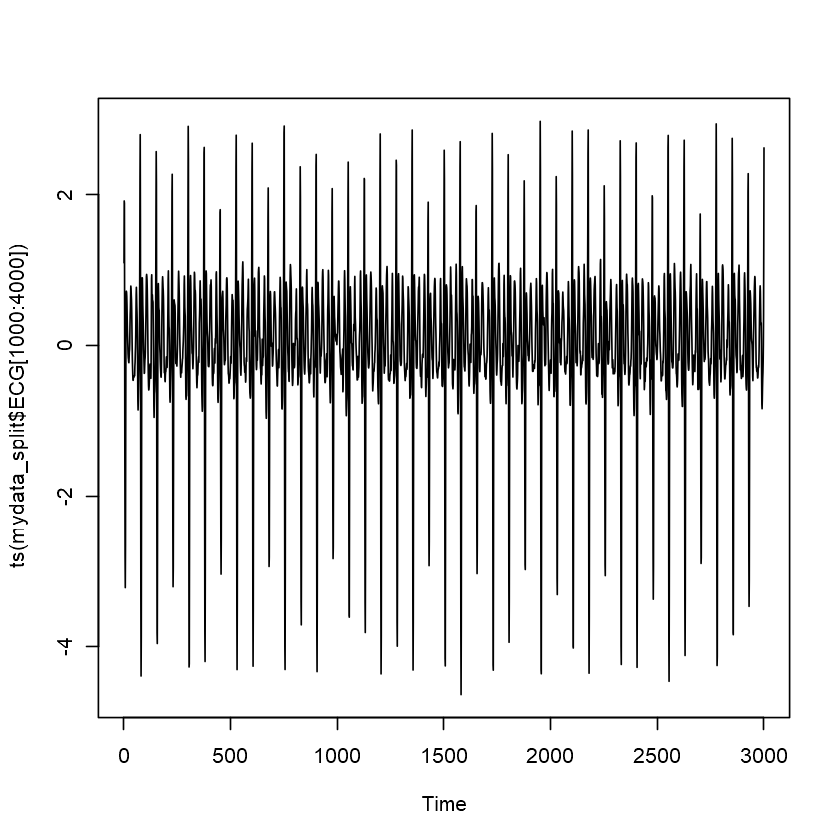

...

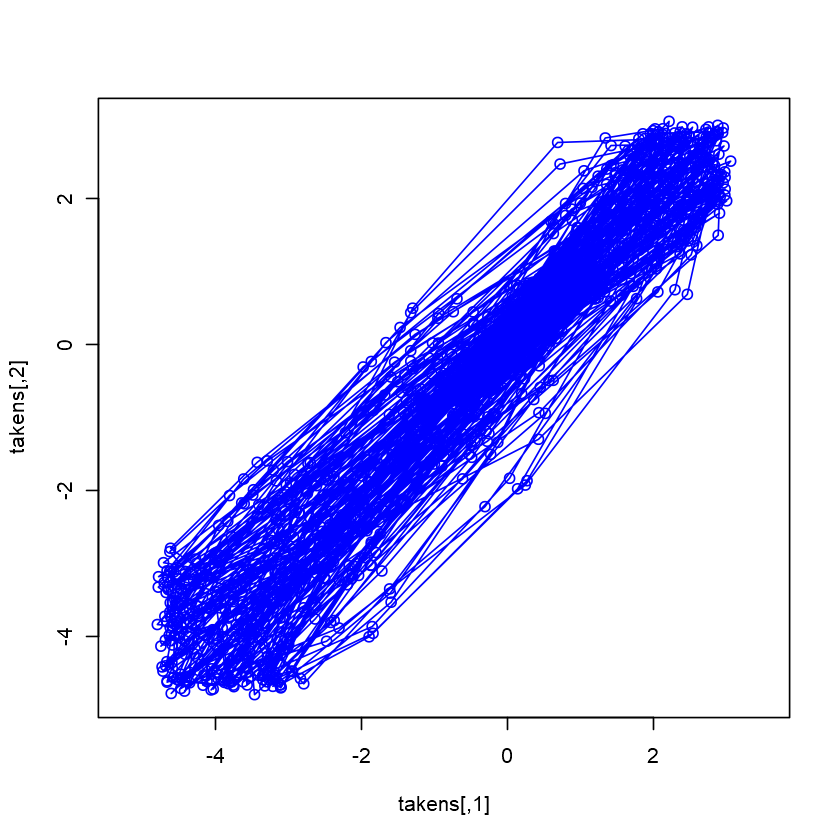

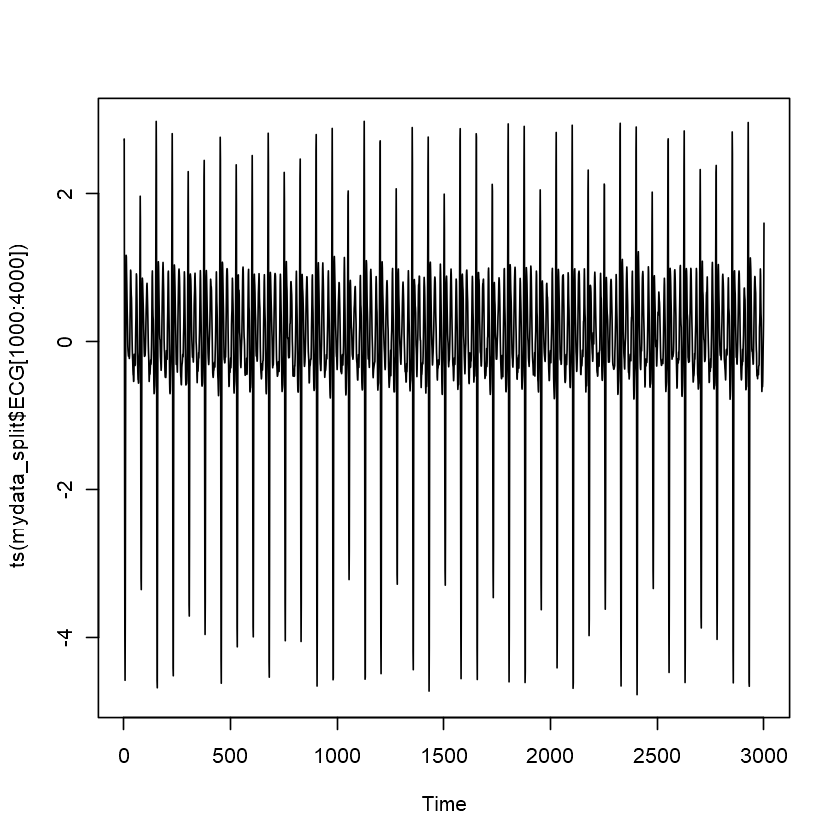

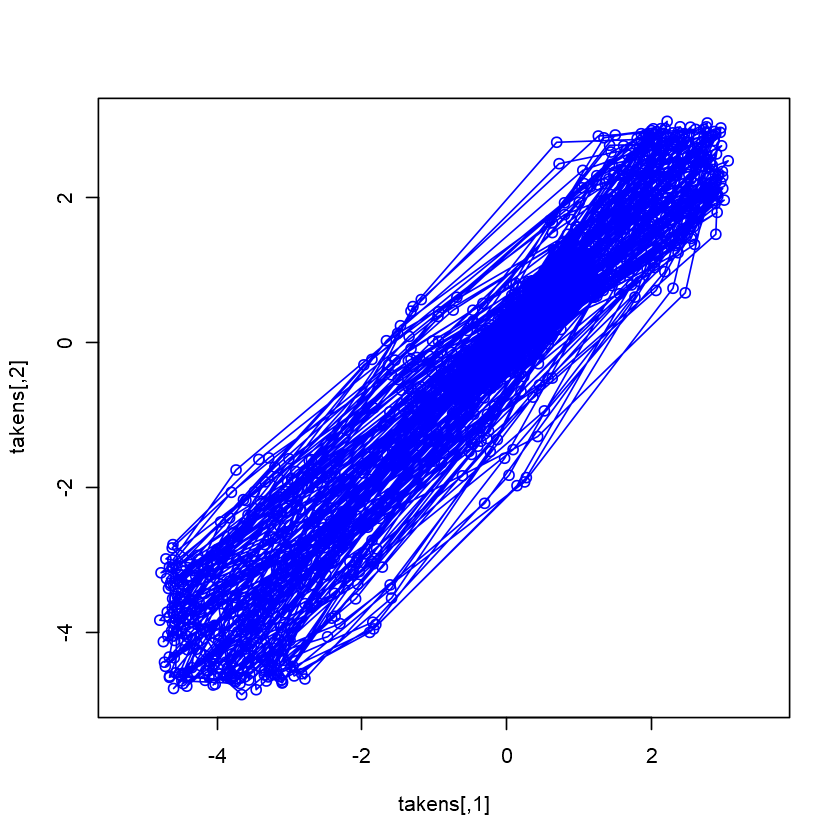

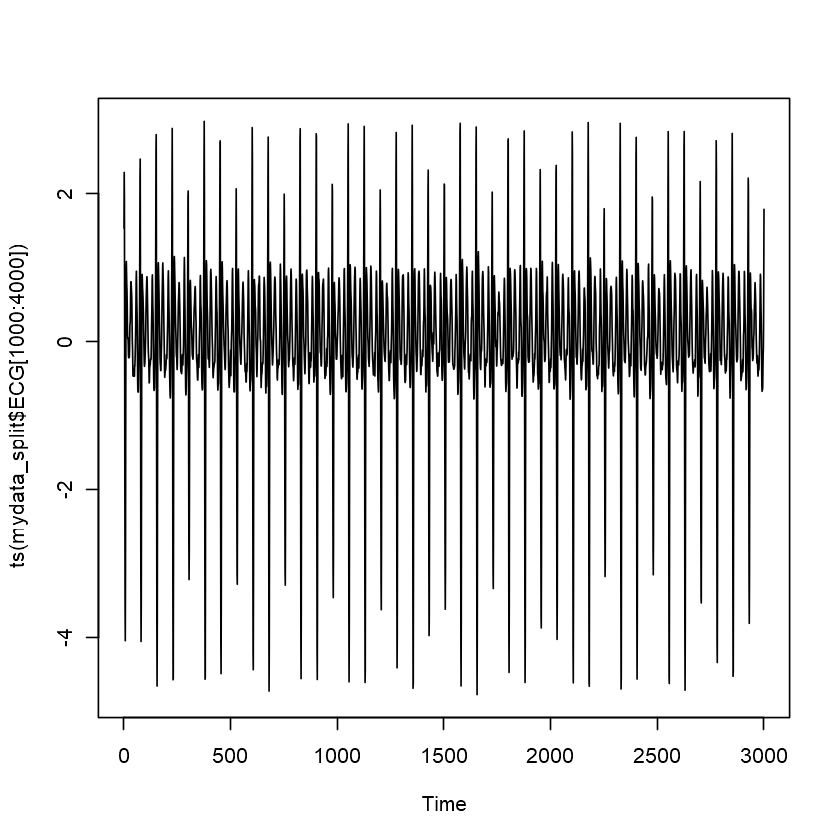

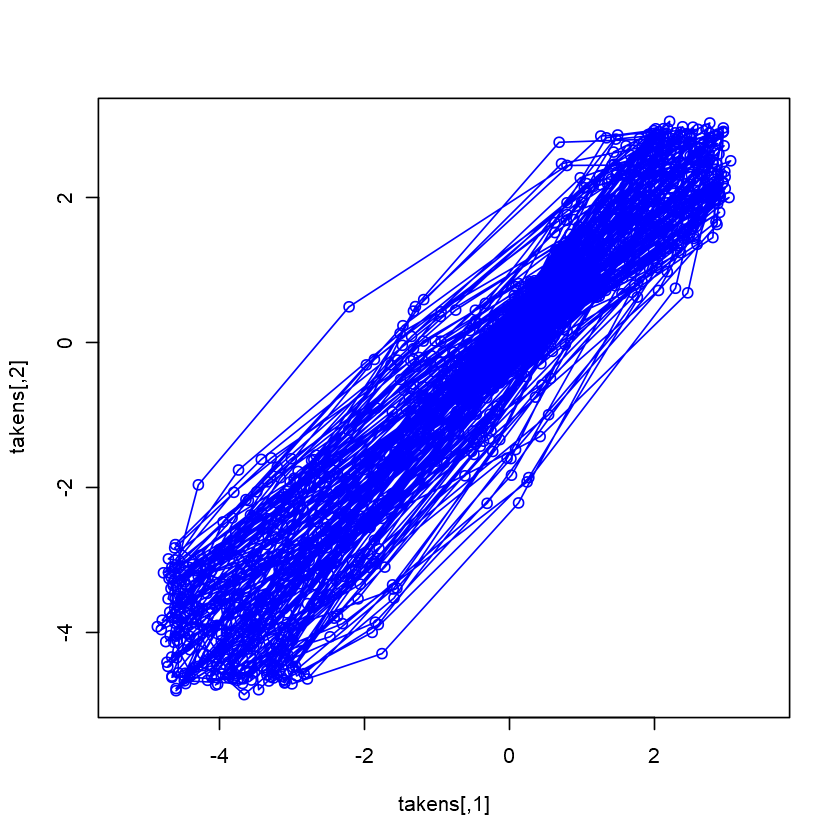

In [16]:
grid_count=array(0,33)
sgridTAU=array(0,33)

for(j in 1:33){
   mydata_split=mydata_std[c(indices[,j]),]
   tail(mydata_split)
   plot(ts(mydata_split$ECG[1000:4000]), t='l' )

## Grid counting
takens = buildTakens(mydata_split$ECG, embedding.dim=2, time.lag=600)
plot(takens, t="o", col="blue", asp=1)
nrows=250
ncols=250
xmn <- min(takens[,2])
xmx <- max(takens[,2])
ymn <- min(takens[,1])
ymx <- max(takens[,1])
r <- raster(extent(xmn, xmx, ymn, ymx), nrow = nrows, ncol = ncols)
xy <- data.frame(x=takens[,1], y=takens[,2])
## classify point by cell
xy$cell <- cellFromXY(r, cbind(xy$x, xy$y))
## count point by cell
summ <- xy %>% 
  group_by(cell) %>% 
  tally()
summ0=summ[which(summ$n!=0),]
grid_count_values=nrow(summ0)/(nrows*ncols)*100
grid_count[j]=grid_count_values

### sgridTAU
takens1 = buildTakens(mydata_split$ECG, embedding.dim=2, time.lag=1200) ## lag 30 seconds
takens2 = buildTakens(mydata_split$ECG, embedding.dim=2, time.lag=600) ## lag 60 seconds

xmn1 <- min(takens1[,1])
xmx1 <- max(takens1[,1])
ymn1 <- min(takens1[,2])
ymx1 <- max(takens1[,2])
r1 <- raster(extent(xmn1, xmx1, ymn1, ymx1), nrow = nrows, ncol = ncols)
xy1 <- data.frame(x1=takens1[,1], y1=takens1[,2])
## classify point by cell
xy1$cell <- cellFromXY(r1, cbind(xy1$x1, xy1$y1))
## count point by cell
summ1 <- xy1 %>% 
  group_by(cell) %>% 
  tally()
summ0_1=summ[which(summ1$n!=0),]
grid_count1=nrow(summ0_1)/(nrows*ncols)*100
grid_count1

xmn2 <- min(takens2[,1])
xmx2 <- max(takens2[,1])
ymn2 <- min(takens2[,2])
ymx2 <- max(takens2[,2])
r2 <- raster(extent(xmn2, xmx2, ymn2, ymx2), nrow = nrows, ncol = ncols)
xy2 <- data.frame(x2=takens2[,1], y2=takens2[,2])
## classify point by cell
xy2$cell <- cellFromXY(r2, cbind(xy2$x2, xy2$y2))
## count point by cell
summ2 <- xy2 %>% 
  group_by(cell) %>% 
  tally()
summ0_2=summ[which(summ2$n!=0),]
grid_count2=nrow(summ0_2)/(nrows*ncols)*100
grid_count2

sgridTAU_values=grid_count2-grid_count1
sgridTAU[j]=sgridTAU_values
}

In [17]:
grid_count
results=cbind(grid_count,sgridTAU)
colnames(results)=c("Grid Conuting","SgridTAU")
results
write.csv(results,file="HRV grid counting.csv")

[1] 3.7008 3.7184 3.7248 3.7008 3.6400 3.6544 3.6768 3.6592 3.6816 3.6288
[11] 3.6064 3.5760 3.6608 3.6960 3.7344 3.6576 3.6592 3.6608 3.6688 3.6576
[21] 3.6496 3.4928 3.3696 3.3632 3.3808 3.3392 3.3344 3.3424 3.3264 3.2896
[31] 3.2688 3.2528 3.2080

Grid Conuting,SgridTAU
3.7008,0.2816
3.7184,0.2512
3.7248,0.2384
3.7008,0.2352
3.6400,0.1984
3.6544,0.2352
3.6768,0.2368
3.6592,0.2528
3.6816,0.2976
3.6288,0.2816
